In [1]:
import copy
import sys
import os

import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
import pandas as pd
import numpy as np

from read_dicom import *
from build_mesh import *
from gfmodel import *

from time import process_time

C:\Users\birnb\anaconda3\envs\Getfem\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  if __name__ == '__main__':


## EnKF Subroutine

In [2]:
def EnKF(A_EnKF, data, dataerr):
    A = A_EnKF.copy() # A matrix
    M = len(data) # Number of the measurement
    N = A_EnKF.shape[1] # Number of the ensemble
    Ndim = A_EnKF.shape[0] # Number of the measurements + parameters
    Np = Ndim - M # Number of the parameters

    OneN = np.ones([N, N]) / N # 1_N matrix

    A_bar = A @ OneN # A bar matrix: A_bar = A OneN
    A_prm = A - A_bar # A' = A - A_bar

    # H matrix
    H1 = np.zeros([Np, M])
    H2 = np.identity(M)
    H = np.vstack((H1, H2)).transpose()

    # Measurement Matrix
    d = np.kron(np.ones((N, 1)), data).transpose()

    # E-matrix: method I (using uncertainty)
    E = np.kron(np.ones((N, 1)), dataerr).transpose()

    # measurement + pertubation
    D = d + E

    # DHA = D - HA
    DHA = D - H @ A

    # HApE = HA' + E
    HApE = H @ A_prm + E

    # Singular value decomposition
    U, S, V = np.linalg.svd(HApE)
    SIGinv = (S @ S.T) ** (-1)
    
    # calculate the analysis ensemble
    X1 = SIGinv * U.transpose()
    X2 = X1 @ DHA
    X3 = U @ X2
    X4 = (H @ A_prm).transpose() @ X3
    Aa = A + A_prm @ X4

    return Aa

## Forward model

In [3]:
def forward_model(mu, x_scale, y_scale, vels, mesh, spl, spl2d_u, spl2d_v, mask, frame, g, eta_max):
    rho0, rhoh, K, tau_y, n = mu
    u_sol, v_sol, P_sol = gfmodel(x_scale,y_scale,vels,mesh,spl,spl2d_u,spl2d_v,mask,
                                  frame>int(dat['End frame'].values[0]),g,rho0,rhoh,K,tau_y,n,eta_max)    
    return u_sol, v_sol, P_sol

## Read data

Nothing to delete
Already exists


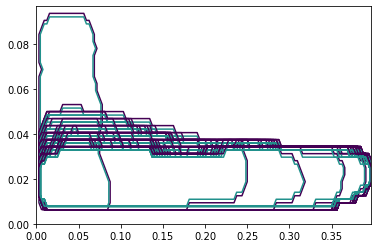

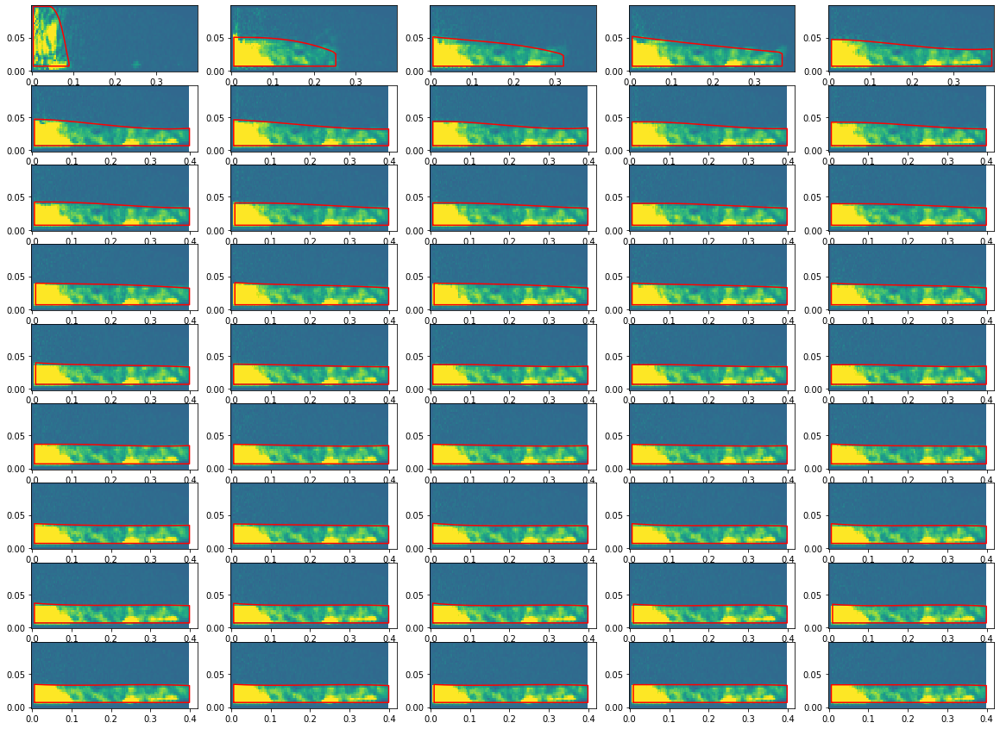

In [4]:
SESSION = 'BoyceTest01'
path_to_download = 'C:/path/to/flywheel/Magma Flow/SUBJECTS/' + SESSION + '/SESSIONS/Boyce^Magma Flow/ACQUISITIONS'

path_mag = 'BEAT_FQ2_n2o10_venc10_2d_5';
path_vel = ['BEAT_FQ2_n2o10_venc10_2d_5_P', 'BEAT_FQ2_n2o10_venc10_2d_5_P_0'];

df = pd.read_excel('C:/path/to/Experiments list.xlsx')
dat = df.loc[df.Session == SESSION].loc[df.String==path_mag]

mags, masks, vels, frames, ts, ptsx_dict, ptsy_dict, spls = read_dicom(SESSION,path_to_download, path_mag, path_vel)

fig, ax = plt.subplots(figsize=(20,15),nrows=np.int32(np.ceil(mags.shape[0]/5)),ncols=5)
masks_transparent = masks.copy()
masks_transparent[masks==1] = np.nan
dx = 0.4/mags.shape[2]
x_scale = np.arange(mags.shape[2])*dx
y_scale = np.arange(mags.shape[1])*dx
X,Y = np.meshgrid(x_scale,y_scale)
for i, axi in enumerate(ax.flatten()):
    axi.pcolormesh(x_scale,y_scale,mags[i,:,:],shading='auto',vmin=-0.01,vmax=0.02)
    #axi.imshow(np.flipud(masks_transparent[i,:,:]),cmap='Greys',alpha=0.2)
    axi.plot(ptsx_dict[i],ptsy_dict[i],'r')
    
phi_gas = dat['Gas vol %'].values[0]/100 # convert to fraction
phi_solid = dat['Particle vol %'].values[0]/100
eta_liq = dat['Liquid viscosity (St)'].values[0]*1000/975 # convert to Pas
g = 9.81
eta_max = 10**4
expid = dat['expid'].values[0]

## Prepare ensemble

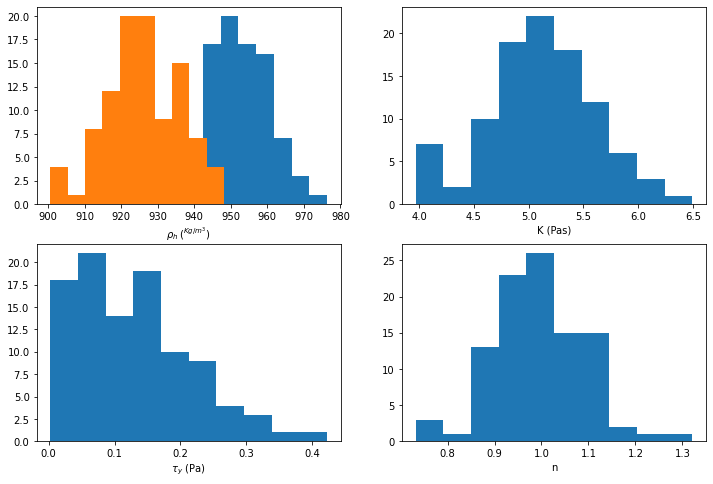

In [5]:
# number of ensemble
nens = 100
# number of iteration
nitr = 3

# number of the parameters
npar = 5
# Initial parameter guess
# Density at top and bottom (Kg/m^3)
rho0c0 = np.random.standard_normal(nens)*975*phi_gas/5 + 975*(1-phi_gas/2)
rhohc0 = np.random.standard_normal(nens)*975*phi_gas/5 + 975*(1-phi_gas)

# Consistency, K (Pas)
Kc0 = np.abs(np.random.standard_normal(nens)*eta_liq/10 + eta_liq*(1-phi_solid/0.6)**(-2.5))
# yield strength, tau_y (Pa)
tauy_init = 10**(70*(phi_solid - 0.3))
tauyc0 = np.abs(np.random.standard_normal(nens)*(tauy_init/10+0.1) + tauy_init + 0.1)
# flow index, n
nc0 = np.abs(np.random.standard_normal(nens)*0.1 + 1)

## Plot initial ensemble parameter
plt.figure(3,figsize=(12,8))
plt.subplot(221)
plt.hist(rho0c0)
plt.xlabel(r'$\rho_0 \: (^{Kg/m^3})$')
plt.hist(rhohc0)
plt.xlabel(r'$\rho_h \: (^{Kg/m^3})$')
plt.subplot(222)
plt.hist(Kc0)
plt.xlabel('K (Pas)')
plt.subplot(223)
plt.hist(tauyc0)
plt.xlabel(r'$\tau_y$ (Pa)')
plt.subplot(224)
plt.hist(nc0)
plt.xlabel('n')
#plt.savefig('InitialEnsemble.pdf')
plt.show()

## EnKF Inversion

step = 0
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 1
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 2
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 3
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 4
itr = 0
Ensemble = 0
Ensemble =

C:\Users\birnb\Documents\GetFEM\MRI\build_mesh.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,10))


itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 21
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 22
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 23
itr = 0
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 1
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
itr = 2
Ensemble = 0
Ensemble = 20
Ensemble = 40
Ensemble = 60
Ensemble = 80
step = 24
itr = 0
Ensemble = 0
Ensemble = 20
E

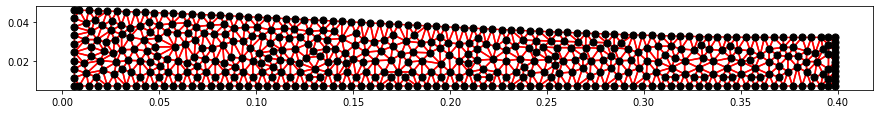

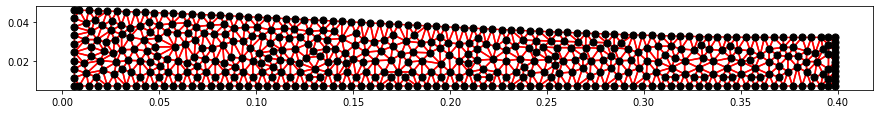

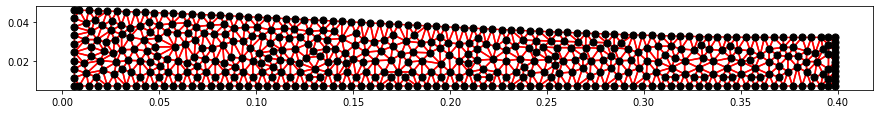

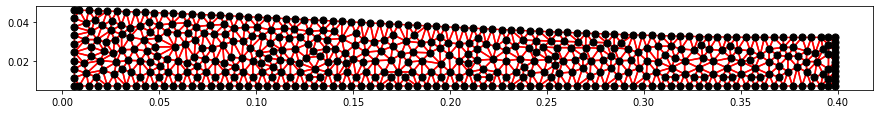

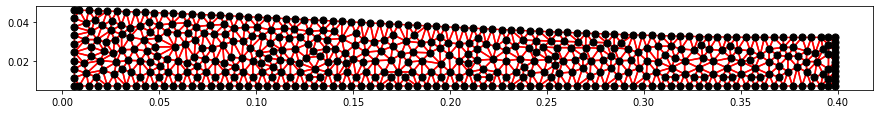

...

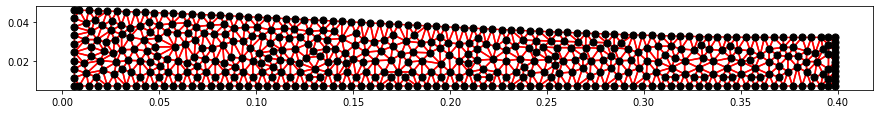

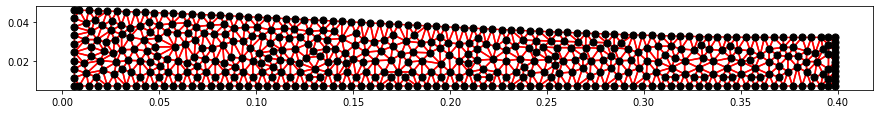

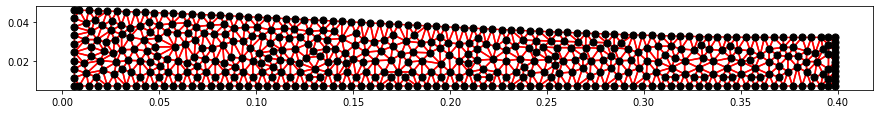

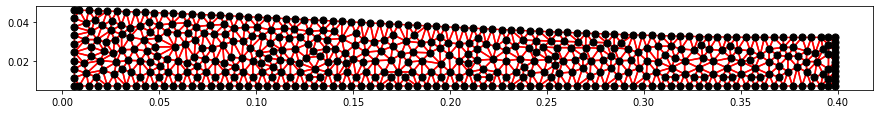

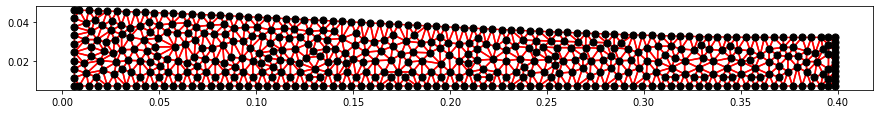

In [22]:
# number of measurements
nobs = 4096 # forward model output should match input data
# allocate the A matrix
A = np.zeros([npar + 2*nobs, nens])
# storing the parameters into the A matrix
A[0, :] = rho0c0
A[1, :] = rhohc0
A[2, :] = Kc0
A[3, :] = tauyc0
A[4, :] = nc0

# allocate the root mean square error
RMSE = np.zeros([len(frames),nens])
# allocate the parameter estimation
param_est = np.zeros([npar, nens, len(frames)])
# storing the initial parameter
param_est[:, :, 0] = A[0:npar, :]
# store error from each iteration to check for convergence
conv = np.zeros([len(frames),nitr])

# for all time steps 
for step in np.arange(0, len(frames)):
    print('step = {}'.format(step))
    Dat_u = vels[step,:,:,0].copy().flatten()
    Dat_u[masks[step,:,:].flatten()==0] = 0
    Dat_v = vels[step,:,:,1].copy().flatten()
    Dat_v[masks[step,:,:].flatten()==0] = 0
    
    spl2d_u = sciinterp.RectBivariateSpline(x_scale,y_scale,vels[step,:,:,0].transpose(),kx=3,ky=3,s=1.6e4)
    spl2d_v = sciinterp.RectBivariateSpline(x_scale,y_scale,vels[step,:,:,1].transpose(),kx=3,ky=3,s=1.6e4)
    
    Err_u = np.ones(nobs)*np.nanmean(np.sqrt((vels[step,:,:,0] - spl2d_u.ev(X,Y))**2))
    Err_v = np.ones(nobs)*np.nanmean(np.sqrt((vels[step,:,:,1] - spl2d_v.ev(X,Y))**2))
    
    mesh, pts = build_mesh(ptsx_dict[6],ptsy_dict[6])
    
    # for all iterations
    for iteration in np.arange(0, nitr):
        print('itr = {}'.format(iteration))
        
        # calculate forecast ensemble (Step 2)
        for i in np.arange(nens):
            u_sol, v_sol, P_sol = forward_model(A[:5,i], x_scale, y_scale, vels[step,:,:,:], mesh, spls[step], spl2d_u, 
                                                spl2d_v, masks[step,:,:], frames[step], g, eta_max)
            u_sol[np.isnan(u_sol)] = 0
            v_sol[np.isnan(v_sol)] = 0

            # store the data into A matrix
            A[npar:npar+nobs, i] = u_sol.flatten()
            A[npar+nobs:npar+2*nobs, i] = v_sol.flatten()
            
            # Root mean square error (RMSE)
            RMSE[step,i] = (np.nansum((u_sol.flatten() - Dat_u) ** 2) / (len(Dat_u) - 1))**(1/2) + (np.nansum((v_sol.flatten() - Dat_v) ** 2) / (len(Dat_v) - 1))**(1/2) # could change to include measurement uncertainty
        
            #print('RMSE = {}'.format(RMSE[i].mean()))
            if (i%20 == 0): 
                print('Ensemble = {}'.format(i))
      
        # EnKF analysis (Step 3 & 4)
        A = EnKF(A, np.append(Dat_u,Dat_v), np.append(Err_u,Err_v))
        conv[step,iteration] = np.mean(RMSE[step,:])
        
    # store the parameter estimation
    param_est[:,:,step] = A[0:npar, :]
    
print('All done')



In [67]:
# Write results to files

param_est.tofile('param_est_' + expid + '.txt')
conv.tofile('conv_' + expid + '.txt')

NameError: name 'conv' is not defined